In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
%pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 75.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 105.9 MB/s eta 0:00:00


In [37]:
import torch 
from transformers import AutoImageProcessor, ViTMAEForPreTraining, ViTForImageClassification, ViTMAEModel
from tqdm import tqdm
from torch.utils.data import DataLoader, Dataset
from torchvision.io import read_image
import os
import torchvision.transforms as T
from torchvision.models.feature_extraction import get_graph_node_names
from torchvision.models.feature_extraction import create_feature_extractor
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import random
import numpy as np
from torch.optim import Adam
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import requests
import json

In [6]:
model = ViTForImageClassification.from_pretrained("google/vit-base-patch16-224")
model.classifier.out_features = 48
model.classifier.weight = torch.nn.Parameter(model.classifier.weight[:48, :])
model.classifier.bias = torch.nn.Parameter(torch.randn(48))

checkpoint = torch.load('/content/gdrive/MyDrive/Colab_Notebooks/Modal/checkpoint-87.pth', map_location=torch.device('cpu'))
model.load_state_dict(checkpoint['model'])

<All keys matched successfully>

In [7]:
# image_processor = AutoImageProcessor.from_pretrained("facebook/vit-mae-base")
# model = ViTMAEForPreTraining.from_pretrained("facebook/vit-mae-base")
# url = "http://images.cocodataset.org/val2017/000000039769.jpg"
# image = Image.open(requests.get(url, stream=True).raw)


resizer = T.Resize((224, 224),antialias=None)

In [9]:
img_gosling1 = Image.open('/content/gdrive/MyDrive/Colab_Notebooks/Modal/gosling1.jpeg')
img_gosling2 = Image.open('/content/gdrive/MyDrive/Colab_Notebooks/Modal/gosling2.jpeg')

In [ ]:
# input_image = torch.Tensor(image_processor(image, return_value='pt')['pixel_values'])

In [10]:
output_gosling1 = model(T.ToTensor()(resizer(img_gosling1))[None, ...], output_attentions=True)
attentions_gosling1 =  output_gosling1.attentions

In [11]:
output_gosling2 = model(T.ToTensor()(resizer(img_gosling2))[None, ...], output_attentions=True)
attentions_gosling2 =  output_gosling2.attentions

In [12]:
@torch.no_grad()
def visualize_attentions(attentions,  image, input_image, show_att_map=False, threshold_division=3):
    
    att_mat = torch.stack(list(attentions)).clone().detach()
    att_mat = att_mat.squeeze(1)
    # Average the attention weights across all heads.
    att_mat = torch.mean(att_mat, dim=1)
#     print(att_mat.shape)

    # To account for residual connections, we add an identity matrix to the
    # attention matrix and re-normalize the weights.
    residual_att = torch.eye(att_mat.size(1))
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

    # Recursively multiply the weight matrices
    joint_attentions = torch.zeros(aug_att_mat.size())
    joint_attentions[0] = aug_att_mat[0]
    

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])
        
    grid_size = int(np.sqrt(aug_att_mat.size(-1)))

    
    
    for i, v in enumerate(joint_attentions):
        # Attention from the output token to the input space.
        mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
        mask = cv2.resize(mask / mask.max(), image.size)[..., np.newaxis]
        mask_min, mask_max = mask.min(), mask.max()
        thresholds = np.sort(np.linspace(mask_min, mask_max, threshold_division))[::-1]
        value = 0.9
        mask_new = np.zeros((mask.shape[0], mask.shape[1], mask.shape[2]))
        for j in range(len(thresholds) - 1):
            value /= 2
            mask_threshold = mask < thresholds[j]
            mask_new += mask * mask_threshold * value
        
        result = (mask_new * image).astype("uint8")
        if show_att_map:
            fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 16))
            ax1.set_title('Original')
            ax2.set_title('Attention Map_%d Layer with image' % (i+1))
            ax3.set_title('Attention Map_%d Layer' % (i+1))
            _ = ax1.imshow(image)
            _ = ax2.imshow(result)
            _ = ax3.imshow(mask_new)
        else:
            fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
            ax1.set_title('Original')
            ax2.set_title('Attention Map_%d Layer with image' % (i+1))
            _ = ax1.imshow(image)
            _ = ax2.imshow(result)

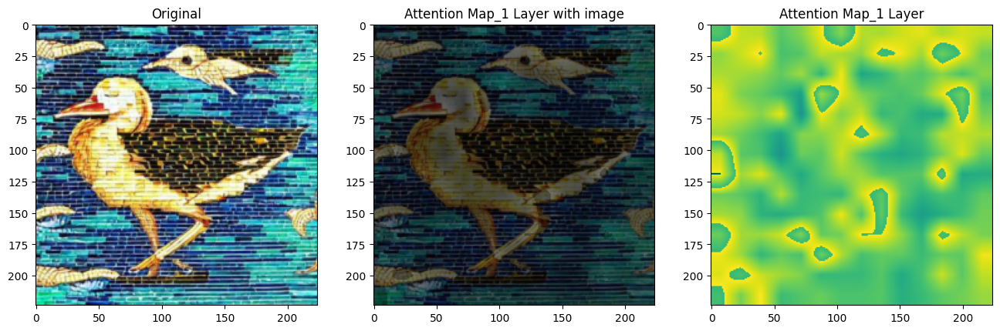

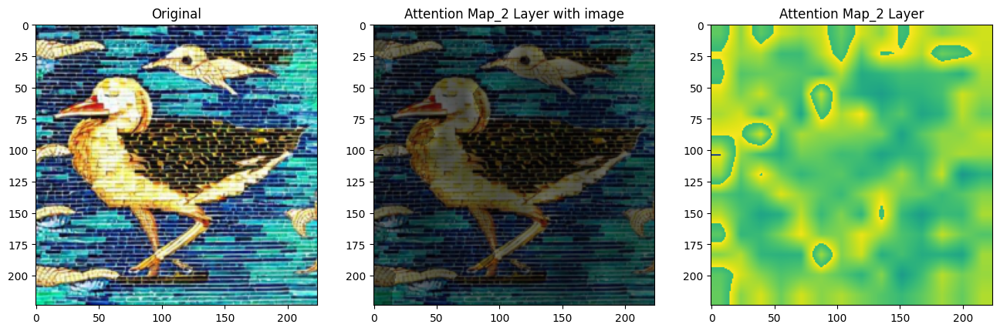

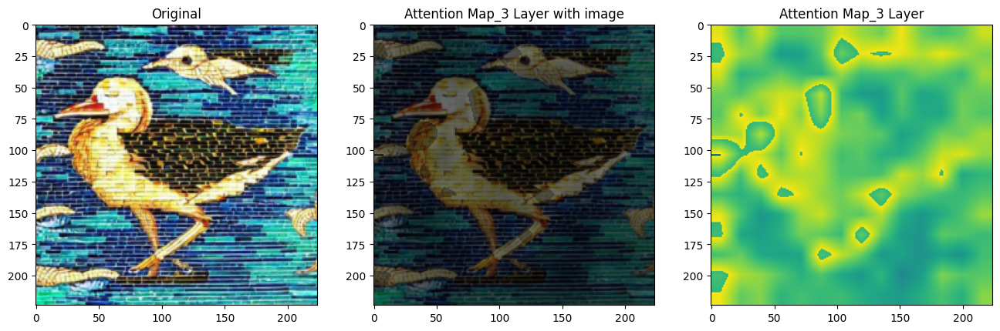

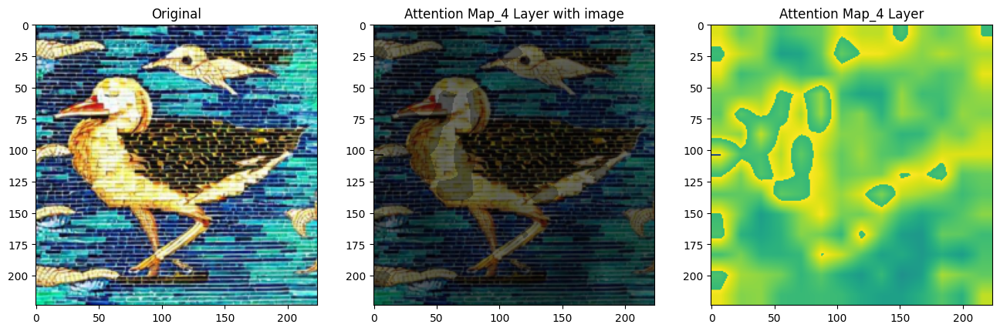

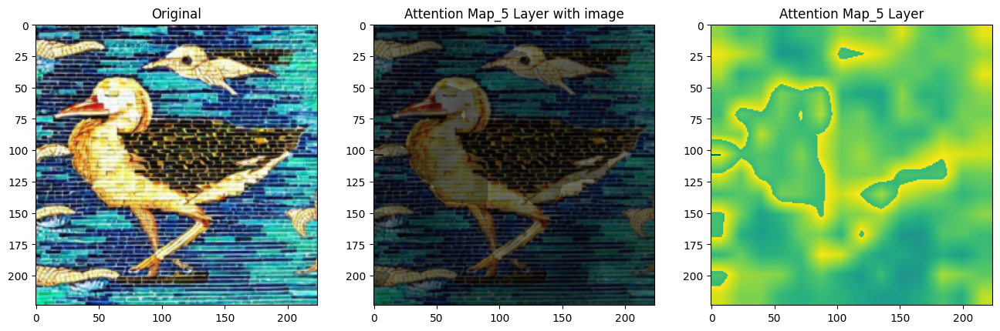

...

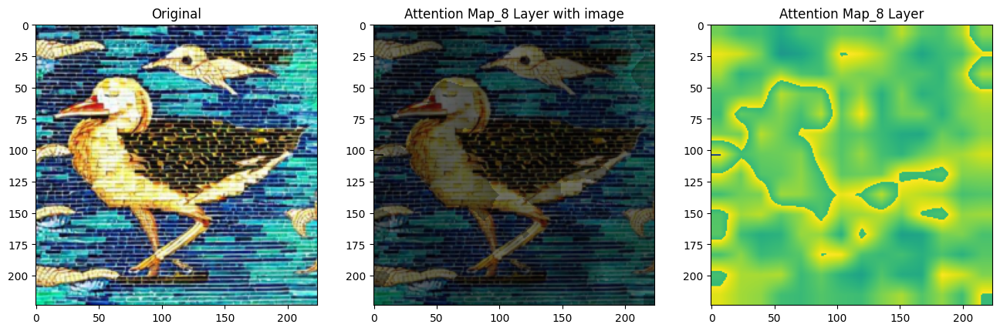

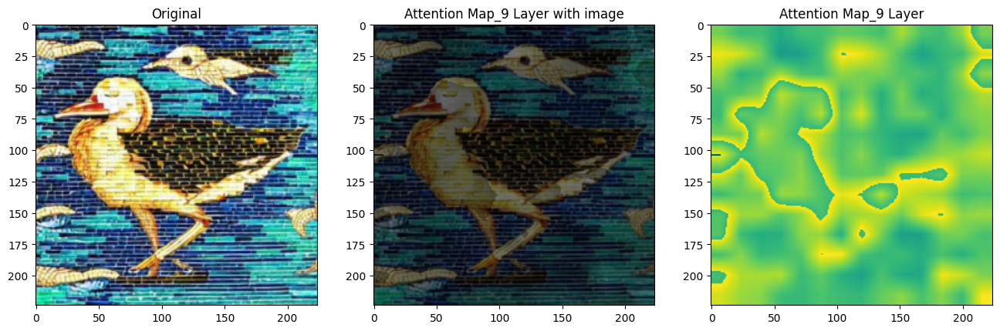

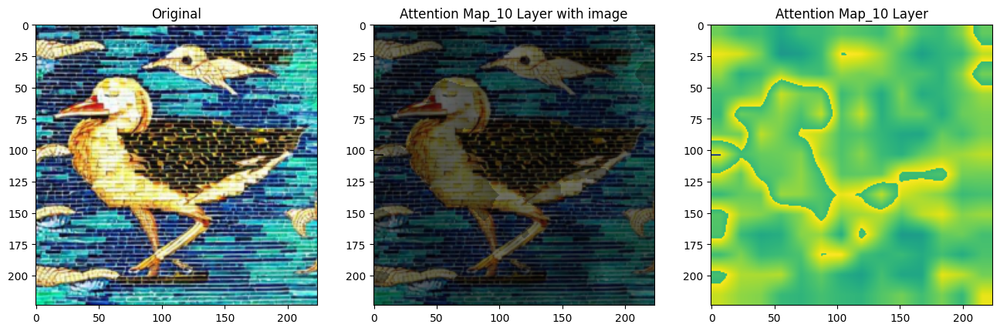

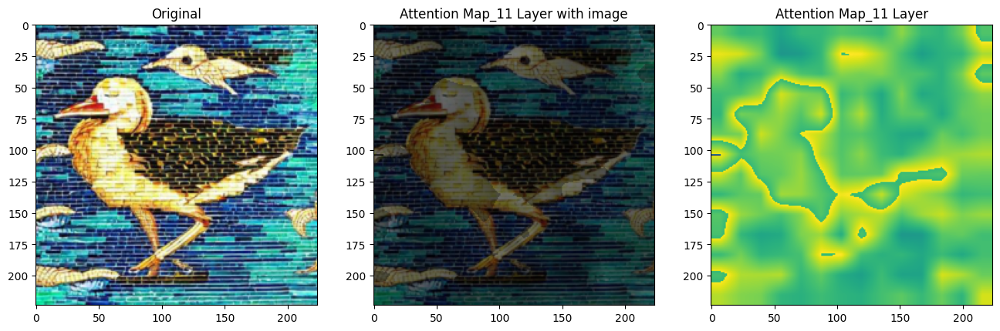

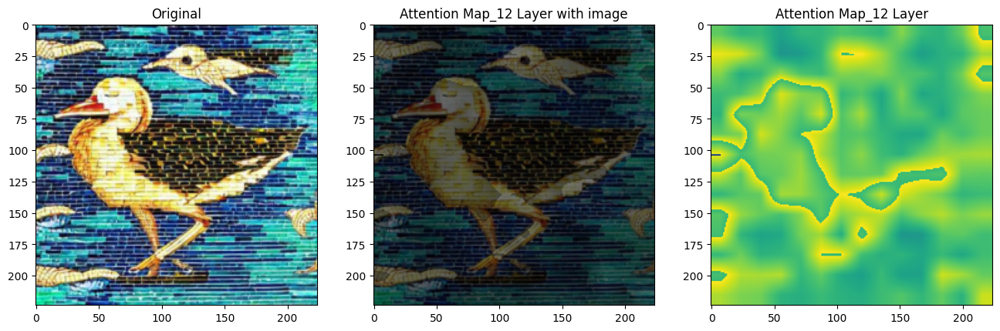

In [13]:
visualize_attentions(attentions_gosling1, resizer(img_gosling1), img_gosling1, True)

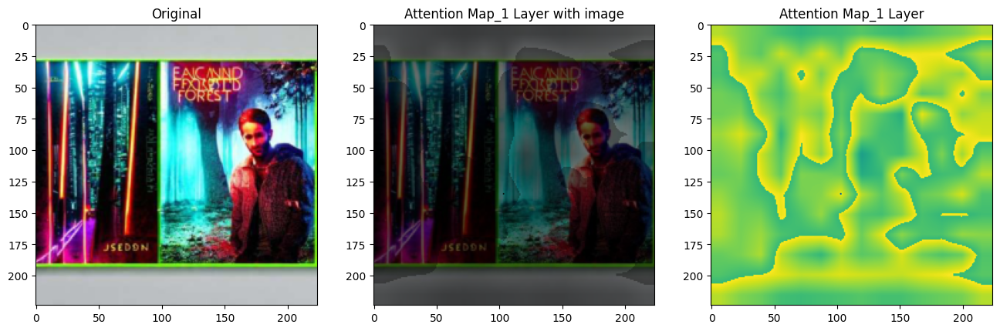

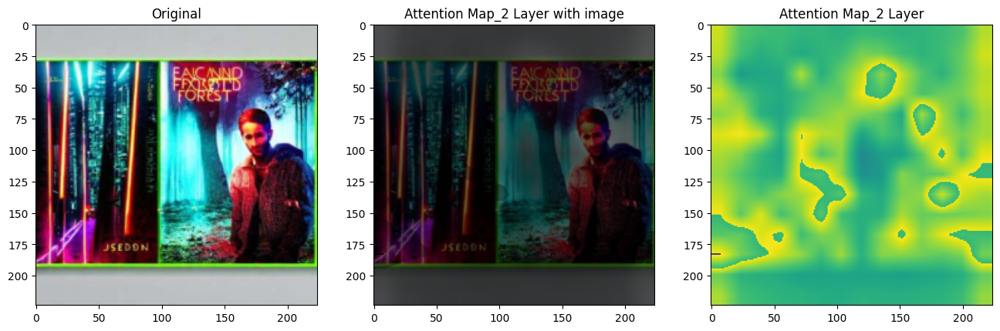

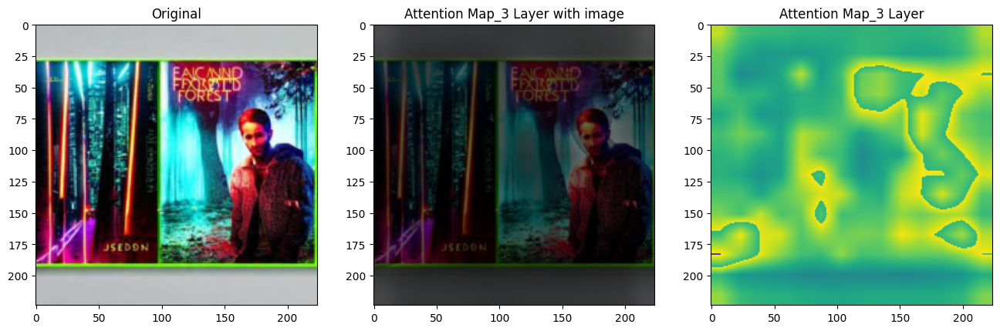

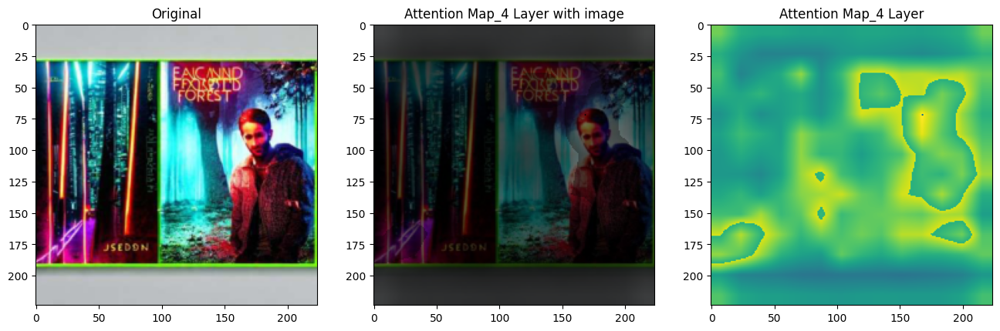

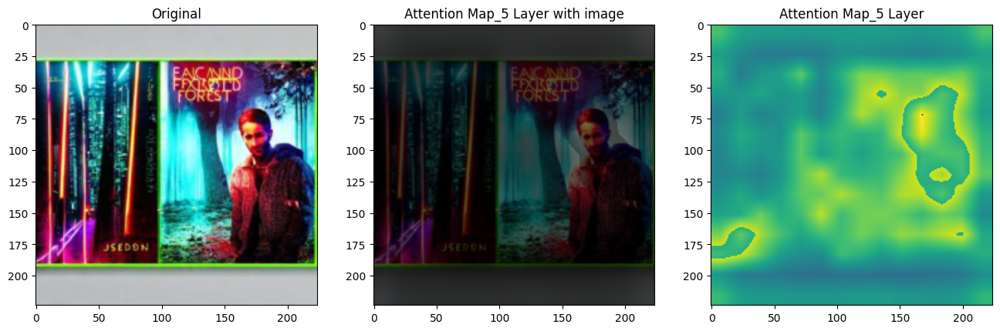

...

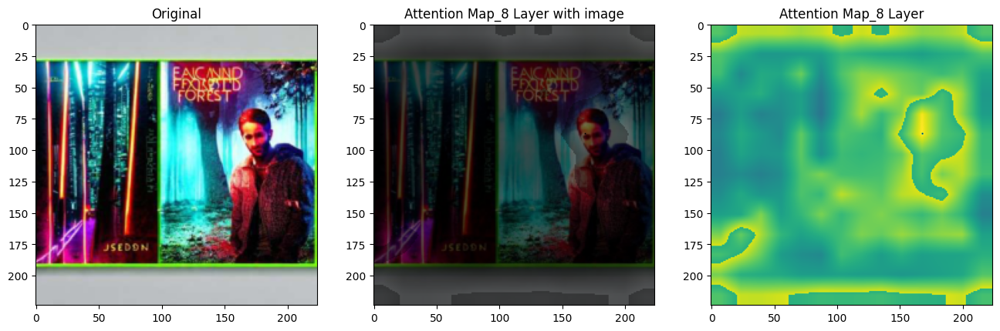

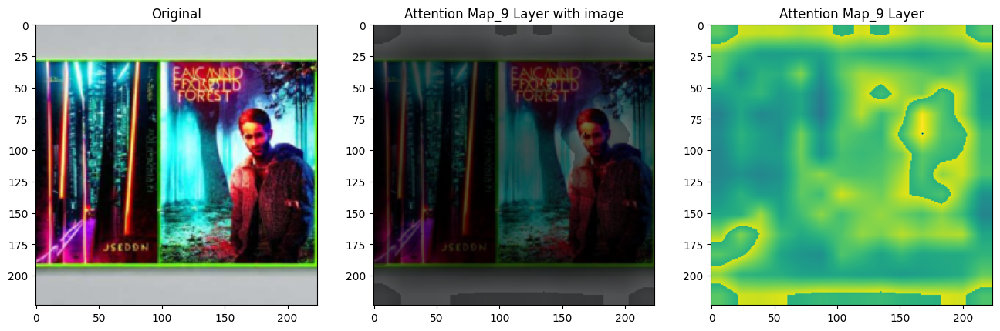

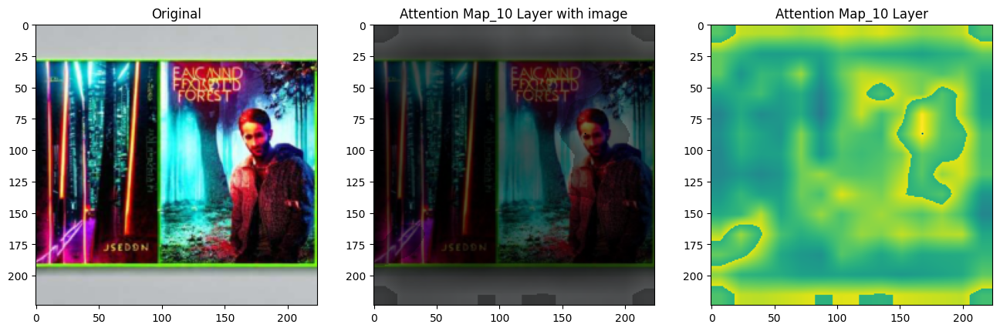

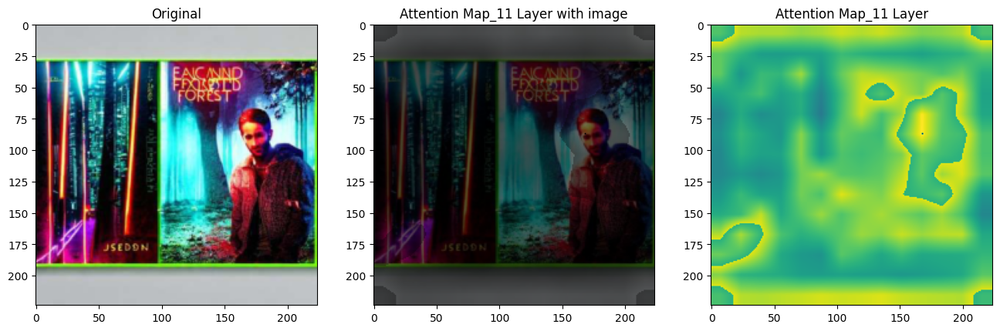

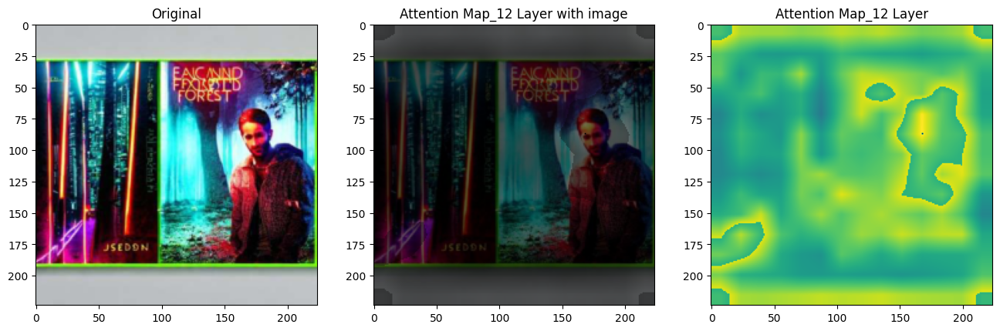

In [14]:
visualize_attentions(attentions_gosling2, resizer(img_gosling2), img_gosling2, True)

In [28]:
m = torch.nn.Softmax(dim=1)

In [32]:
with torch.no_grad():
    output = model(T.ToTensor()(resizer(img_gosling1))[None, ...])
    output_logits1 = output.logits

    label_digits1 = output_logits.argmax(dim=1)

In [33]:
with torch.no_grad():
    output = model(T.ToTensor()(resizer(img_gosling2))[None, ...])
    output_logits2 = output.logits

    label_digits2 = output_logits.argmax(dim=1)

In [46]:
label_digits1, label_digits2, list(label_dict.keys())[19], list(label_dict.keys())[25]

(tensor([25]), tensor([25]), 'duckling', 'gosling')

In [35]:
m(output_logits1)

tensor([[0.0065, 0.0063, 0.0089, 0.0079, 0.0073, 0.0840, 0.0116, 0.0077, 0.0219,
         0.0084, 0.0347, 0.0412, 0.0124, 0.0209, 0.0152, 0.0122, 0.0394, 0.0639,
         0.0168, 0.1261, 0.0458, 0.0296, 0.0038, 0.0058, 0.0052, 0.0218, 0.0069,
         0.0166, 0.0149, 0.0082, 0.0057, 0.0146, 0.0075, 0.0161, 0.0243, 0.0061,
         0.0324, 0.0205, 0.0134, 0.0064, 0.0081, 0.0146, 0.0066, 0.0059, 0.0220,
         0.0266, 0.0112, 0.0460]])

In [36]:
m(output_logits2)

tensor([[0.0085, 0.0048, 0.0286, 0.0158, 0.0063, 0.0393, 0.0151, 0.0038, 0.0138,
         0.0127, 0.0111, 0.0125, 0.0072, 0.0384, 0.0111, 0.0010, 0.0076, 0.1855,
         0.0055, 0.0042, 0.0234, 0.0098, 0.0090, 0.0124, 0.0068, 0.3038, 0.0167,
         0.0054, 0.0124, 0.0043, 0.0024, 0.0158, 0.0031, 0.0045, 0.0128, 0.0012,
         0.0016, 0.0079, 0.0088, 0.0052, 0.0043, 0.0024, 0.0027, 0.0043, 0.0278,
         0.0162, 0.0074, 0.0349]])

In [39]:
with open('/content/gdrive/MyDrive/Colab_Notebooks/Modal/labels_dict.json', 'r') as f:
    label_dict = json.load(f)

In [45]:
list(label_dict.keys())[19]

'duckling'